# **Deliverable by Ignasi Mas: Content-Based Image Retrieval for color-based shirt recommendation**

This Notebook will be the center of the deliverable and will be the document to follow in order to read my solution proposal. First I will focus on the ***Method Explained***, step by step, since I feel more comfortable developing it like this. I will also provide the code and the result. This section answers to the first question (*Problem Analysis*).

Then, I will answer the proposed ***Questions*** (excepting the first one, which is answered during *Method Explained* as told).

Many of the Questions are already answered in some manner during the *Method Explained* section, I will refer to that when it is the case.

## **Method Explained**

The problem formulates as follows :

We have a pool of 5k unsupervised images which contain shirts of unknown colors in different contexts, and a subset of 10 *blue* shirts, which we know is a specific color (or a specific range on a colorspace). From this subset, we must get the *blue* shirts from the unsupervised pool.

Thus, our goal is to find all the samples from an unsupervised pool that share a specific feature with the ones in the subset. The main issue in this problem is predicting the feature from the fully unsupervised images. However, we know the definition of the desired feature, *color of the shirt*, and we should take profit from it.

Below, some images from the pool.

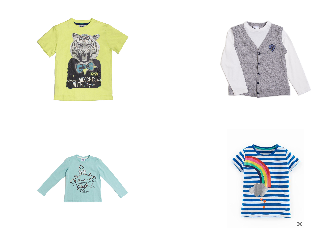

This problem is not new in the literature and it is called Content-Based Image Retrieval. It is the problem used for applications like *Google reverse image search*. However, in this case, we have the particularities of performing the search based on a specific feature and using more than one sample as the Query.

In the literature, this kind of problem is solved in two stages. First, a Feature Extraction, and then some sample matching depending on the application. Despite our particularities, we can also consider this pipeline. The particularities apply to the way we perform each stage (the specific feature applies to the Feature Extraction while the multiple sample query applies in how do we perform the matching).

### **Feature Extraction**

The goal of this stage is to infer a Feature Stage where all the samples can be represented in an optimal way to perform the matching. It could be done in a Straight-forward manner by using a VAE network, which is commonly used to perform an unsupervised Feature Extraction from images. However, we can see intuitively that it will focus on many irrelevant features and will have no way the specific feature we wish to have. Instead of that, we can force the feature space to represent the shirt color.

Concretely, we would like to obtain specific features of the color. In that sense, my proposal is using the HSV feature space and getting rid of the V (value of brightness), which is irrelevant to the true color of the shirt since it is more influenced by the conditions of the image. In that sense, we can represent the color in a circular plot containing the Hue and Saturation components. Hue is an angular feature while Saturation can be represented by the distance to the circle center (being grey at the center and the saturated color at the circle limit).


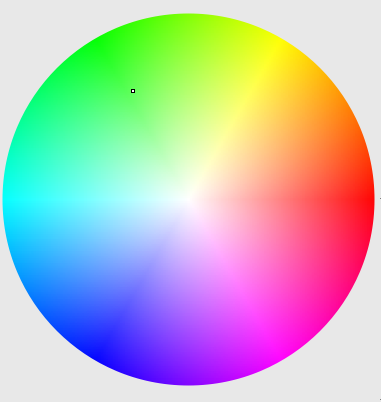

Getting the color of the shirt in each image is the hardest step in the whole method. It requires getting all the pixels within the shirt in order to get its representative color (for that we will use the mean). Thus, we need to segment the shirt in each image from the background as well as from its inner patterns. 

#### Segmentation

I will approach this as a purely unsupervised problem, which is what makes it difficult. The info we have from the shirt is:

* **Color**: heterogeneity against the background
* **Position**: the shirt is usually centered
* **Area**: we can assume it takes a minimum area ratio from the image.
* **Shape**: it is associated with a specific shape, although sometimes it gets different poses
* **Context**: no info since it may be in different contexts (on a person, plain or wilder background, etc)


A segmentation approach that takes benefit from the color information is the Watershed Region growing algorithm, which from a seed estimates the pixels belonging to an element based on color differences when the region grows from the seed. However, this seed is not trivial to get and should represent the area where the shirt region must begin to grow in order to get the shirt.

I propose as a first step using a binary mask from the areas where the Saturation value is high as a first step making it the seed. This way, it will most likely take the shirt area as well as other foreground objects (for example, a person’s face).

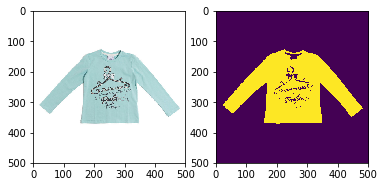

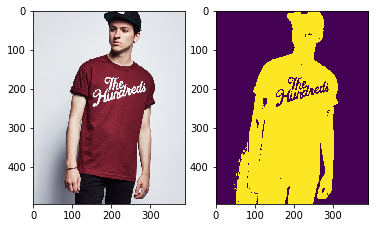

In [39]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

saturation_thr = 30

demo_images = ('shirts_0013.png', 'shirts_0018.png')

for dimg in demo_images:
    img = cv2.imread(dimg)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    threshhsv = hsv[..., 1] > saturation_thr
    thresh = (threshhsv * 255).astype(np.uint8)

    fig = plt.figure()
    fig.add_subplot(1,2,1)
    plt.imshow(img)
    fig.add_subplot(1,2,2)
    plt.imshow(thresh)
    plt.show()

I then apply some noise removal and estimate the seeds

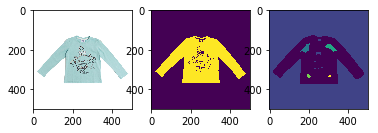

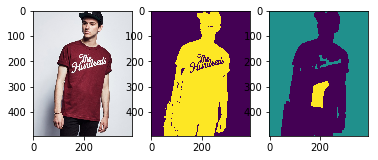

In [40]:
demo_images = ('shirts_0013.png', 'shirts_0018.png')

for dimg in demo_images:
    img = cv2.imread(dimg)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    threshhsv = hsv[..., 1] > saturation_thr
    thresh = (threshhsv * 255).astype(np.uint8)

    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0

    fig = plt.figure()
    fig.add_subplot(1,3,1)
    plt.imshow(img)
    fig.add_subplot(1,3,2)
    plt.imshow(thresh)
    fig.add_subplot(1,3,3)
    plt.imshow(markers)
    plt.show()

Then, the Watershed area will estimate the whole regions.

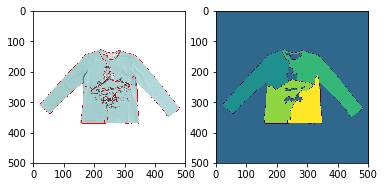

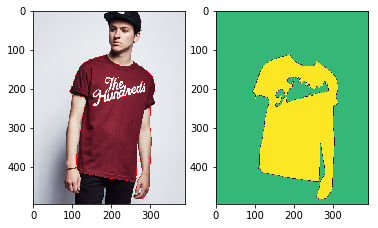

In [42]:
demo_images = ('shirts_0013.png', 'shirts_0018.png')

for dimg in demo_images:
    img = cv2.imread(dimg)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    threshhsv = hsv[..., 1] > saturation_thr
    thresh = (threshhsv * 255).astype(np.uint8)

    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    
    markers = cv2.watershed(img, markers)
    
    img[markers == -1] = [255,0,0]

    fig = plt.figure()
    fig.add_subplot(1,2,1)
    plt.imshow(img)
    fig.add_subplot(1,2,2)
    plt.imshow(markers)
    plt.show()

Then I can apply some post-processing techniques in order to get only the shirt (or approximate it). 

First, from the position info, I will discard the area on the borders (10% each). There is no problem if the shirt is larger than usual and it gets some region area discarded since most of it will still be considered, and I will just get rid of objects in the borders (e.g. most of the people’s heads).

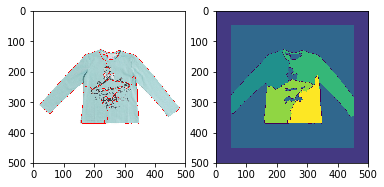

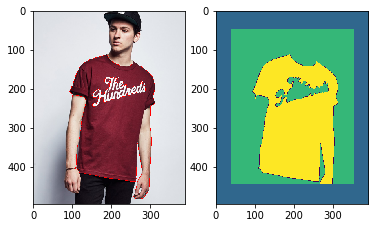

In [43]:
demo_images = ('shirts_0013.png', 'shirts_0018.png')

for dimg in demo_images:
    img = cv2.imread(dimg)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    threshhsv = hsv[..., 1] > saturation_thr
    thresh = (threshhsv * 255).astype(np.uint8)

    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    
    markers = cv2.watershed(img, markers)
    
    img[markers == -1] = [255,0,0]
    
    msk_x1 = int(img.shape[0] * 0.1)
    msk_x2 = int(img.shape[0] * 0.9)
    msk_y1 = int(img.shape[1] * 0.1)
    msk_y2 = int(img.shape[1] * 0.9)

    msk_center = np.zeros(markers.shape)
    msk_center[msk_x1:msk_x2, msk_y1:msk_y2] = 1
    markers_centered = msk_center * markers

    fig = plt.figure()
    fig.add_subplot(1,2,1)
    plt.imshow(img)
    fig.add_subplot(1,2,2)
    plt.imshow(markers_centered)
    plt.show()

After that, regions with an area below a certain threshold will also be discarded. Although a shirt may be partitioned between different regions, I am assuming that there will still be one or some of them that will be big enough to be representative.

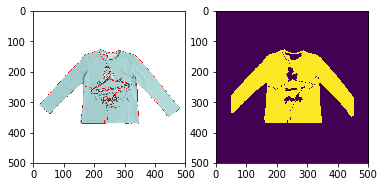

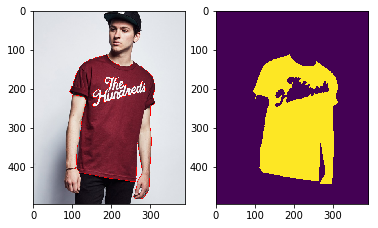

In [44]:
demo_images = ('shirts_0013.png', 'shirts_0018.png')

for dimg in demo_images:
    img = cv2.imread(dimg)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    threshhsv = hsv[..., 1] > saturation_thr
    thresh = (threshhsv * 255).astype(np.uint8)

    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    
    markers = cv2.watershed(img, markers)
    
    img[markers == -1] = [255,0,0]
    
    msk_x1 = int(img.shape[0] * 0.1)
    msk_x2 = int(img.shape[0] * 0.9)
    msk_y1 = int(img.shape[1] * 0.1)
    msk_y2 = int(img.shape[1] * 0.9)

    msk_center = np.zeros(markers.shape)
    msk_center[msk_x1:msk_x2, msk_y1:msk_y2] = 1
    markers_centered = msk_center * markers
    
    bin_total_msk = np.zeros(markers_centered.shape)

    unv = np.unique(markers_centered, return_counts=True)[0]
    occurences = np.unique(markers_centered, return_counts=True)[1]

    for val, nocc in zip(unv, occurences):
        if nocc > bin_total_msk.size * 0.01 and val not in (-1, 0, 1):
            bin_total_msk[markers_centered == val] = 1

    fig = plt.figure()
    fig.add_subplot(1,2,1)
    plt.imshow(img)
    fig.add_subplot(1,2,2)
    plt.imshow(bin_total_msk)
    plt.show()

Finally, I will merge the remaining regions and use another area threshold and use the remaining shape information to estimate if the shirt has been taken as the whole region. For the shape information, different approaches can be used, I will use the matching ratio within a rescaled custom shirt shape in order to estimate it. There are more robust methods, but it may still help.

This way I will have used Color, Position, Area and Shape information to get the shirt area.

We can see some results below:

In [184]:
a = np.zeros((500,500))
a[100:400, 100:200] = 1
a[200:300, 100:450] = 1
print(np.array([np.array(np.where(a == 1)).min(axis=1),np.array(np.where(a == 1)).max(axis=1)]).sum())

1048


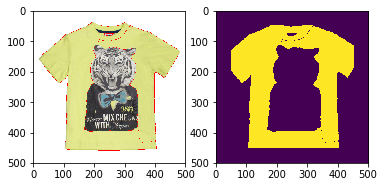

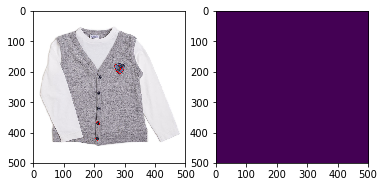

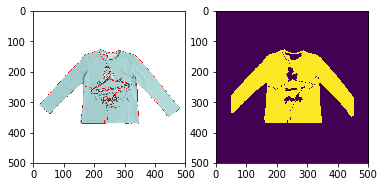

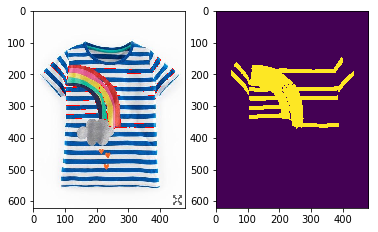

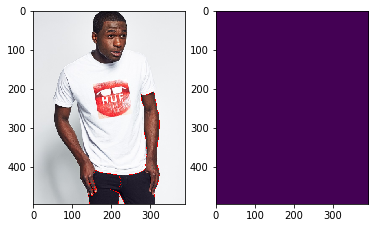

...

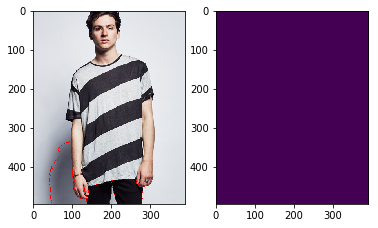

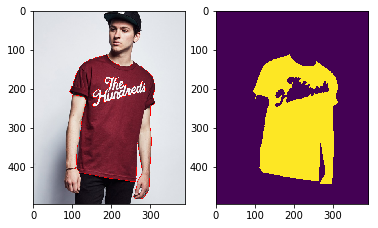

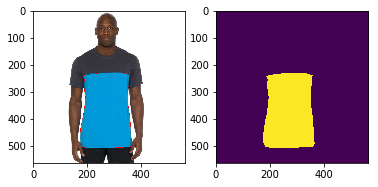

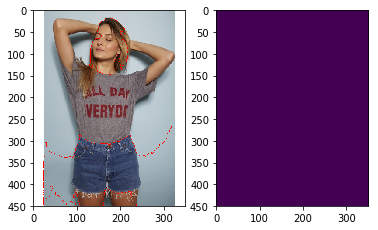

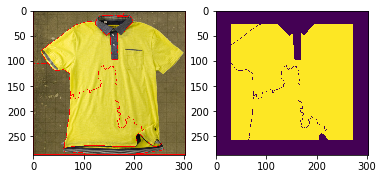

In [200]:
demo_images = ['shirts_00' + str(nm) + '.png' for nm in range(11, 22)]

for dimg in demo_images:
    img = cv2.imread(dimg)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    threshhsv = hsv[..., 1] > saturation_thr
    thresh = (threshhsv * 255).astype(np.uint8)

    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    
    markers = cv2.watershed(img, markers)
    
    img[markers == -1] = [255,0,0]
    
    msk_x1 = int(img.shape[0] * 0.1)
    msk_x2 = int(img.shape[0] * 0.9)
    msk_y1 = int(img.shape[1] * 0.1)
    msk_y2 = int(img.shape[1] * 0.9)

    msk_center = np.zeros(markers.shape)
    msk_center[msk_x1:msk_x2, msk_y1:msk_y2] = 1
    markers_centered = msk_center * markers
    
    bin_total_msk = np.zeros(markers_centered.shape)

    unv = np.unique(markers_centered, return_counts=True)[0]
    occurences = np.unique(markers_centered, return_counts=True)[1]

    for val, nocc in zip(unv, occurences):
        if nocc > bin_total_msk.size * 0.01 and val not in (-1, 0, 1):
            bin_total_msk[markers_centered == val] = 1
    
    if bin_total_msk.sum() < bin_total_msk.size * 0.1:
        bin_total_msk = np.zeros(markers_centered.shape)
    else:    
        msk_bbox = np.array([np.array(np.where(bin_total_msk == 1)).min(axis=1),np.array(np.where(bin_total_msk == 1)).max(axis=1)]) if bin_total_msk.any() else np.zeros((2,2))
        msk_bbox_size = (msk_bbox[1,0] - msk_bbox[0,0], msk_bbox[1,1] - msk_bbox[0,1])
        kern_shape = np.ones((int((msk_bbox_size[0]*0.05) + 1), int((msk_bbox_size[1]*0.05) + 1)))
        bin_total_closed = cv2.morphologyEx(bin_total_msk, cv2.MORPH_CLOSE, kern_shape, iterations=2)
        tot_area = bin_total_closed[msk_bbox[0,0]:msk_bbox[1,0],msk_bbox[0,1]:msk_bbox[1,1]].sum()
        lbmargin = msk_bbox[0,0] + int(0.1 * msk_bbox_size[0])
        rbmargin = msk_bbox[0,0] + int(0.9 * msk_bbox_size[0])
        tmargin = msk_bbox[0,1] + int(0.5 * msk_bbox_size[1])
        area_lb = bin_total_closed[msk_bbox[0,0]:lbmargin, tmargin:msk_bbox[1,1]].sum()
        area_rb = bin_total_closed[rbmargin:msk_bbox[1,0], tmargin:msk_bbox[1,1]].sum()
        area_lb_pen = area_lb * 2
        area_rb_pen = area_rb * 2
        shape_area = tot_area - area_lb_pen - area_rb_pen
        box_area = (msk_bbox[1,0] - msk_bbox[0,0])*(msk_bbox[1,1] - msk_bbox[0,1])
        if (shape_area / box_area) < 0.33:
            bin_total_msk = np.zeros(markers_centered.shape)        
        
    masked_values_centered = img[bin_total_msk == 1]

    fig = plt.figure()
    fig.add_subplot(1,2,1)
    plt.imshow(img)
    fig.add_subplot(1,2,2)
    plt.imshow(bin_total_msk)
    plt.show()

At this point, considering that in each image we have just image pixels (plus possible FP’s that should be few enough to not distort the result decisively), we can infer the shirt color on each image by taking the mean RGB values from the shirt pixels and then get the hue and saturation from the HSV. If there is no estimated region we will store the index in order to not taking it into account and give 0 hue and saturation. This makes sense since most likely those cases are white or grey shirts so we can already discard them as blue shirts.

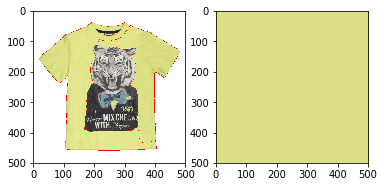

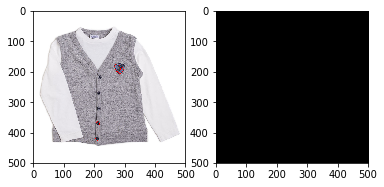

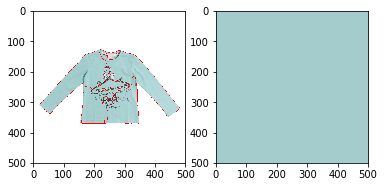

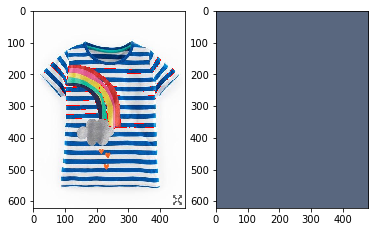

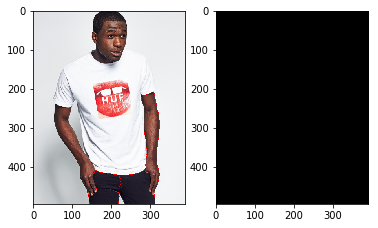

...

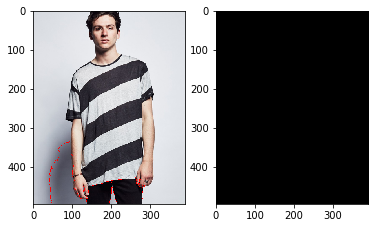

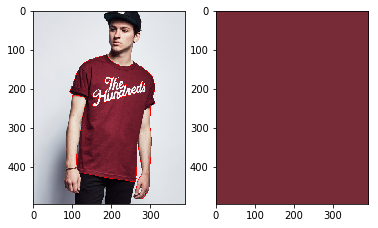

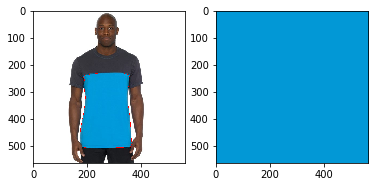

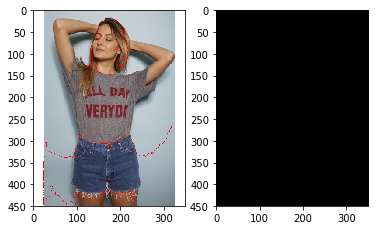

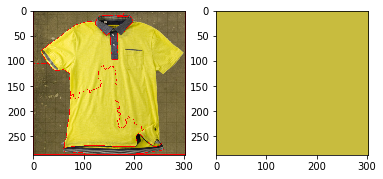

In [201]:
import colorsys

demo_images = ['shirts_00' + str(nm) + '.png' for nm in range(11, 22)]

no_regions = []

for iif, dimg in enumerate(demo_images):
    img = cv2.imread(dimg)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    threshhsv = hsv[..., 1] > saturation_thr
    thresh = (threshhsv * 255).astype(np.uint8)

    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    
    markers = cv2.watershed(img, markers)
    
    img[markers == -1] = [255,0,0]
    
    msk_x1 = int(img.shape[0] * 0.1)
    msk_x2 = int(img.shape[0] * 0.9)
    msk_y1 = int(img.shape[1] * 0.1)
    msk_y2 = int(img.shape[1] * 0.9)

    msk_center = np.zeros(markers.shape)
    msk_center[msk_x1:msk_x2, msk_y1:msk_y2] = 1
    markers_centered = msk_center * markers
    
    bin_total_msk = np.zeros(markers_centered.shape)

    unv = np.unique(markers_centered, return_counts=True)[0]
    occurences = np.unique(markers_centered, return_counts=True)[1]

    for val, nocc in zip(unv, occurences):
        if nocc > bin_total_msk.size * 0.01 and val not in (-1, 0, 1):
            bin_total_msk[markers_centered == val] = 1
    
    if bin_total_msk.sum() < bin_total_msk.size * 0.1:
        bin_total_msk = np.zeros(markers_centered.shape)
    else:    
        msk_bbox = np.array([np.array(np.where(bin_total_msk == 1)).min(axis=1),np.array(np.where(bin_total_msk == 1)).max(axis=1)]) if bin_total_msk.any() else np.zeros((2,2))
        msk_bbox_size = (msk_bbox[1,0] - msk_bbox[0,0], msk_bbox[1,1] - msk_bbox[0,1])
        kern_shape = np.ones((int((msk_bbox_size[0]*0.05) + 1), int((msk_bbox_size[1]*0.05) + 1)))
        bin_total_closed = cv2.morphologyEx(bin_total_msk, cv2.MORPH_CLOSE, kern_shape, iterations=2)
        tot_area = bin_total_closed[msk_bbox[0,0]:msk_bbox[1,0],msk_bbox[0,1]:msk_bbox[1,1]].sum()
        lbmargin = msk_bbox[0,0] + int(0.1 * msk_bbox_size[0])
        rbmargin = msk_bbox[0,0] + int(0.9 * msk_bbox_size[0])
        tmargin = msk_bbox[0,1] + int(0.5 * msk_bbox_size[1])
        area_lb = bin_total_closed[msk_bbox[0,0]:lbmargin, tmargin:msk_bbox[1,1]].sum()
        area_rb = bin_total_closed[rbmargin:msk_bbox[1,0], tmargin:msk_bbox[1,1]].sum()
        area_lb_pen = area_lb * 2
        area_rb_pen = area_rb * 2
        shape_area = tot_area - area_lb_pen - area_rb_pen
        box_area = (msk_bbox[1,0] - msk_bbox[0,0])*(msk_bbox[1,1] - msk_bbox[0,1])
        if (shape_area / box_area) < 0.33:
            bin_total_msk = np.zeros(markers_centered.shape)  

    masked_values_centered = img[bin_total_msk == 1]
    
    if masked_values_centered.size > 0:

        infered_color = masked_values_centered.mean(axis=0)

    else:
        
        infered_color = np.array([0, 0, 0])

        no_regions.append(iif)
    
    the_color = np.ones([img.shape[0], img.shape[1], 3]) * infered_color
    
    fig = plt.figure()
    fig.add_subplot(1,2,1)
    plt.imshow(img)
    fig.add_subplot(1,2,2)
    plt.imshow(the_color.astype(np.int))
    plt.show()

So we can apply this to the whole pool of unlabeled images and get all the Hue and Saturation Values. We can also represent them in a circular plot.

In [202]:
def get_samples_in_feature_space(imgs_path):

    hsv_samples = []
    no_regions = []
    fld_len = len(os.listdir(imgs_path))

    for iif, imgfile in enumerate(os.listdir(imgs_path)):
        img = cv2.imread(os.path.join(imgs_path, imgfile))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        threshhsv = hsv[..., 1] > saturation_thr
        thresh = (threshhsv * 255).astype(np.uint8)

        kernel = np.ones((3, 3), np.uint8)
        opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
        sure_bg = cv2.dilate(opening, kernel, iterations=3)
        dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
        ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

        sure_fg = np.uint8(sure_fg)
        unknown = cv2.subtract(sure_bg, sure_fg)
        ret, markers = cv2.connectedComponents(sure_fg)
        markers = markers + 1
        markers[unknown == 255] = 0

        markers = cv2.watershed(img, markers)

        img[markers == -1] = [255,0,0]

        msk_x1 = int(img.shape[0] * 0.1)
        msk_x2 = int(img.shape[0] * 0.9)
        msk_y1 = int(img.shape[1] * 0.1)
        msk_y2 = int(img.shape[1] * 0.9)

        msk_center = np.zeros(markers.shape)
        msk_center[msk_x1:msk_x2, msk_y1:msk_y2] = 1
        markers_centered = msk_center * markers

        bin_total_msk = np.zeros(markers_centered.shape)

        unv = np.unique(markers_centered, return_counts=True)[0]
        occurences = np.unique(markers_centered, return_counts=True)[1]

        for val, nocc in zip(unv, occurences):
            if nocc > bin_total_msk.size * 0.01 and val not in (-1, 0, 1):
                bin_total_msk[markers_centered == val] = 1

        if bin_total_msk.sum() < bin_total_msk.size * 0.1:
            bin_total_msk = np.zeros(markers_centered.shape)
        else:    
            msk_bbox = np.array([np.array(np.where(bin_total_msk == 1)).min(axis=1),np.array(np.where(bin_total_msk == 1)).max(axis=1)]) if bin_total_msk.any() else np.zeros((2,2))
            msk_bbox_size = (msk_bbox[1,0] - msk_bbox[0,0], msk_bbox[1,1] - msk_bbox[0,1])
            kern_shape = np.ones((int((msk_bbox_size[0]*0.05) + 1), int((msk_bbox_size[1]*0.05) + 1)))
            bin_total_closed = cv2.morphologyEx(bin_total_msk, cv2.MORPH_CLOSE, kern_shape, iterations=2)
            tot_area = bin_total_closed[msk_bbox[0,0]:msk_bbox[1,0],msk_bbox[0,1]:msk_bbox[1,1]].sum()
            lbmargin = msk_bbox[0,0] + int(0.1 * msk_bbox_size[0])
            rbmargin = msk_bbox[0,0] + int(0.9 * msk_bbox_size[0])
            tmargin = msk_bbox[0,1] + int(0.5 * msk_bbox_size[1])
            area_lb = bin_total_closed[msk_bbox[0,0]:lbmargin, tmargin:msk_bbox[1,1]].sum()
            area_rb = bin_total_closed[rbmargin:msk_bbox[1,0], tmargin:msk_bbox[1,1]].sum()
            area_lb_pen = area_lb * 2
            area_rb_pen = area_rb * 2
            shape_area = tot_area - area_lb_pen - area_rb_pen
            box_area = (msk_bbox[1,0] - msk_bbox[0,0])*(msk_bbox[1,1] - msk_bbox[0,1])
            if (shape_area / box_area) < 0.33:
                bin_total_msk = np.zeros(markers_centered.shape)  

        masked_values_centered = img[bin_total_msk == 1]

        if masked_values_centered.size > 0:

            infered_color = masked_values_centered.mean(axis=0)

            infered_color_hsv = colorsys.rgb_to_hsv(*infered_color)

            hsv_samples.append(infered_color_hsv[:2])

        else:

            hsv_samples.append((0, 0))

            no_regions.append(iif)

        print('Done ' + str(iif) + '/' + str(fld_len))
    
    return hsv_samples, no_regions

In [203]:
import os
import math

img_path_pool = os.path.join('shirt_dataset', 'unlabeled')

hsv_samples_pool, no_regions_pool = get_samples_in_feature_space(imgs_path_pool)

samples_positioned_pool = [(hsvs[1] * math.cos(hsvs[0] * 2 * math.pi), hsvs[1] * math.sin(hsvs[0] * 2 * math.pi))
                           for hsvs in hsv_samples_pool]

Done 0/5000
Done 1/5000
Done 2/5000
Done 3/5000
Done 4/5000
Done 5/5000
Done 6/5000
Done 7/5000
Done 8/5000
Done 9/5000
Done 10/5000
Done 11/5000
Done 12/5000
Done 13/5000
Done 14/5000
Done 15/5000
Done 16/5000
Done 17/5000
Done 18/5000
Done 19/5000
Done 20/5000
Done 21/5000
Done 22/5000
Done 23/5000
Done 24/5000
Done 25/5000
Done 26/5000
Done 27/5000
Done 28/5000
Done 29/5000
Done 30/5000
Done 31/5000
Done 32/5000
Done 33/5000
Done 34/5000
Done 35/5000
Done 36/5000
Done 37/5000
Done 38/5000
Done 39/5000
Done 40/5000
Done 41/5000
Done 42/5000
Done 43/5000
Done 44/5000
Done 45/5000
Done 46/5000
Done 47/5000
Done 48/5000
Done 49/5000
Done 50/5000
Done 51/5000
Done 52/5000
Done 53/5000
Done 54/5000
Done 55/5000
Done 56/5000
Done 57/5000
Done 58/5000
Done 59/5000
Done 60/5000
Done 61/5000
Done 62/5000
Done 63/5000
Done 64/5000
Done 65/5000
Done 66/5000
Done 67/5000
Done 68/5000
Done 69/5000
Done 70/5000
Done 71/5000
Done 72/5000
Done 73/5000
Done 74/5000
Done 75/5000
Done 76/5000
Done 77/5

Done 594/5000
Done 595/5000
Done 596/5000
Done 597/5000
Done 598/5000
Done 599/5000
Done 600/5000
Done 601/5000
Done 602/5000
Done 603/5000
Done 604/5000
Done 605/5000
Done 606/5000
Done 607/5000
Done 608/5000
Done 609/5000
Done 610/5000
Done 611/5000
Done 612/5000
Done 613/5000
Done 614/5000
Done 615/5000
Done 616/5000
Done 617/5000
Done 618/5000
Done 619/5000
Done 620/5000
Done 621/5000
Done 622/5000
Done 623/5000
Done 624/5000
Done 625/5000
Done 626/5000
Done 627/5000
Done 628/5000
Done 629/5000
Done 630/5000
Done 631/5000
Done 632/5000
Done 633/5000
Done 634/5000
Done 635/5000
Done 636/5000
Done 637/5000
Done 638/5000
Done 639/5000
Done 640/5000
Done 641/5000
Done 642/5000
Done 643/5000
Done 644/5000
Done 645/5000
Done 646/5000
Done 647/5000
Done 648/5000
Done 649/5000
Done 650/5000
Done 651/5000
Done 652/5000
Done 653/5000
Done 654/5000
Done 655/5000
Done 656/5000
Done 657/5000
Done 658/5000
Done 659/5000
Done 660/5000
Done 661/5000
Done 662/5000
Done 663/5000
Done 664/5000
Done 6

Done 1168/5000
Done 1169/5000
Done 1170/5000
Done 1171/5000
Done 1172/5000
Done 1173/5000
Done 1174/5000
Done 1175/5000
Done 1176/5000
Done 1177/5000
Done 1178/5000
Done 1179/5000
Done 1180/5000
Done 1181/5000
Done 1182/5000
Done 1183/5000
Done 1184/5000
Done 1185/5000
Done 1186/5000
Done 1187/5000
Done 1188/5000
Done 1189/5000
Done 1190/5000
Done 1191/5000
Done 1192/5000
Done 1193/5000
Done 1194/5000
Done 1195/5000
Done 1196/5000
Done 1197/5000
Done 1198/5000
Done 1199/5000
Done 1200/5000
Done 1201/5000
Done 1202/5000
Done 1203/5000
Done 1204/5000
Done 1205/5000
Done 1206/5000
Done 1207/5000
Done 1208/5000
Done 1209/5000
Done 1210/5000
Done 1211/5000
Done 1212/5000
Done 1213/5000
Done 1214/5000
Done 1215/5000
Done 1216/5000
Done 1217/5000
Done 1218/5000
Done 1219/5000
Done 1220/5000
Done 1221/5000
Done 1222/5000
Done 1223/5000
Done 1224/5000
Done 1225/5000
Done 1226/5000
Done 1227/5000
Done 1228/5000
Done 1229/5000
Done 1230/5000
Done 1231/5000
Done 1232/5000
Done 1233/5000
Done 1234/

Done 1715/5000
Done 1716/5000
Done 1717/5000
Done 1718/5000
Done 1719/5000
Done 1720/5000
Done 1721/5000
Done 1722/5000
Done 1723/5000
Done 1724/5000
Done 1725/5000
Done 1726/5000
Done 1727/5000
Done 1728/5000
Done 1729/5000
Done 1730/5000
Done 1731/5000
Done 1732/5000
Done 1733/5000
Done 1734/5000
Done 1735/5000
Done 1736/5000
Done 1737/5000
Done 1738/5000
Done 1739/5000
Done 1740/5000
Done 1741/5000
Done 1742/5000
Done 1743/5000
Done 1744/5000
Done 1745/5000
Done 1746/5000
Done 1747/5000
Done 1748/5000
Done 1749/5000
Done 1750/5000
Done 1751/5000
Done 1752/5000
Done 1753/5000
Done 1754/5000
Done 1755/5000
Done 1756/5000
Done 1757/5000
Done 1758/5000
Done 1759/5000
Done 1760/5000
Done 1761/5000
Done 1762/5000
Done 1763/5000
Done 1764/5000
Done 1765/5000
Done 1766/5000
Done 1767/5000
Done 1768/5000
Done 1769/5000
Done 1770/5000
Done 1771/5000
Done 1772/5000
Done 1773/5000
Done 1774/5000
Done 1775/5000
Done 1776/5000
Done 1777/5000
Done 1778/5000
Done 1779/5000
Done 1780/5000
Done 1781/

Done 2264/5000
Done 2265/5000
Done 2266/5000
Done 2267/5000
Done 2268/5000
Done 2269/5000
Done 2270/5000
Done 2271/5000
Done 2272/5000
Done 2273/5000
Done 2274/5000
Done 2275/5000
Done 2276/5000
Done 2277/5000
Done 2278/5000
Done 2279/5000
Done 2280/5000
Done 2281/5000
Done 2282/5000
Done 2283/5000
Done 2284/5000
Done 2285/5000
Done 2286/5000
Done 2287/5000
Done 2288/5000
Done 2289/5000
Done 2290/5000
Done 2291/5000
Done 2292/5000
Done 2293/5000
Done 2294/5000
Done 2295/5000
Done 2296/5000
Done 2297/5000
Done 2298/5000
Done 2299/5000
Done 2300/5000
Done 2301/5000
Done 2302/5000
Done 2303/5000
Done 2304/5000
Done 2305/5000
Done 2306/5000
Done 2307/5000
Done 2308/5000
Done 2309/5000
Done 2310/5000
Done 2311/5000
Done 2312/5000
Done 2313/5000
Done 2314/5000
Done 2315/5000
Done 2316/5000
Done 2317/5000
Done 2318/5000
Done 2319/5000
Done 2320/5000
Done 2321/5000
Done 2322/5000
Done 2323/5000
Done 2324/5000
Done 2325/5000
Done 2326/5000
Done 2327/5000
Done 2328/5000
Done 2329/5000
Done 2330/

Done 2814/5000
Done 2815/5000
Done 2816/5000
Done 2817/5000
Done 2818/5000
Done 2819/5000
Done 2820/5000
Done 2821/5000
Done 2822/5000
Done 2823/5000
Done 2824/5000
Done 2825/5000
Done 2826/5000
Done 2827/5000
Done 2828/5000
Done 2829/5000
Done 2830/5000
Done 2831/5000
Done 2832/5000
Done 2833/5000
Done 2834/5000
Done 2835/5000
Done 2836/5000
Done 2837/5000
Done 2838/5000
Done 2839/5000
Done 2840/5000
Done 2841/5000
Done 2842/5000
Done 2843/5000
Done 2844/5000
Done 2845/5000
Done 2846/5000
Done 2847/5000
Done 2848/5000
Done 2849/5000
Done 2850/5000
Done 2851/5000
Done 2852/5000
Done 2853/5000
Done 2854/5000
Done 2855/5000
Done 2856/5000
Done 2857/5000
Done 2858/5000
Done 2859/5000
Done 2860/5000
Done 2861/5000
Done 2862/5000
Done 2863/5000
Done 2864/5000
Done 2865/5000
Done 2866/5000
Done 2867/5000
Done 2868/5000
Done 2869/5000
Done 2870/5000
Done 2871/5000
Done 2872/5000
Done 2873/5000
Done 2874/5000
Done 2875/5000
Done 2876/5000
Done 2877/5000
Done 2878/5000
Done 2879/5000
Done 2880/

Done 3362/5000
Done 3363/5000
Done 3364/5000
Done 3365/5000
Done 3366/5000
Done 3367/5000
Done 3368/5000
Done 3369/5000
Done 3370/5000
Done 3371/5000
Done 3372/5000
Done 3373/5000
Done 3374/5000
Done 3375/5000
Done 3376/5000
Done 3377/5000
Done 3378/5000
Done 3379/5000
Done 3380/5000
Done 3381/5000
Done 3382/5000
Done 3383/5000
Done 3384/5000
Done 3385/5000
Done 3386/5000
Done 3387/5000
Done 3388/5000
Done 3389/5000
Done 3390/5000
Done 3391/5000
Done 3392/5000
Done 3393/5000
Done 3394/5000
Done 3395/5000
Done 3396/5000
Done 3397/5000
Done 3398/5000
Done 3399/5000
Done 3400/5000
Done 3401/5000
Done 3402/5000
Done 3403/5000
Done 3404/5000
Done 3405/5000
Done 3406/5000
Done 3407/5000
Done 3408/5000
Done 3409/5000
Done 3410/5000
Done 3411/5000
Done 3412/5000
Done 3413/5000
Done 3414/5000
Done 3415/5000
Done 3416/5000
Done 3417/5000
Done 3418/5000
Done 3419/5000
Done 3420/5000
Done 3421/5000
Done 3422/5000
Done 3423/5000
Done 3424/5000
Done 3425/5000
Done 3426/5000
Done 3427/5000
Done 3428/

Done 3910/5000
Done 3911/5000
Done 3912/5000
Done 3913/5000
Done 3914/5000
Done 3915/5000
Done 3916/5000
Done 3917/5000
Done 3918/5000
Done 3919/5000
Done 3920/5000
Done 3921/5000
Done 3922/5000
Done 3923/5000
Done 3924/5000
Done 3925/5000
Done 3926/5000
Done 3927/5000
Done 3928/5000
Done 3929/5000
Done 3930/5000
Done 3931/5000
Done 3932/5000
Done 3933/5000
Done 3934/5000
Done 3935/5000
Done 3936/5000
Done 3937/5000
Done 3938/5000
Done 3939/5000
Done 3940/5000
Done 3941/5000
Done 3942/5000
Done 3943/5000
Done 3944/5000
Done 3945/5000
Done 3946/5000
Done 3947/5000
Done 3948/5000
Done 3949/5000
Done 3950/5000
Done 3951/5000
Done 3952/5000
Done 3953/5000
Done 3954/5000
Done 3955/5000
Done 3956/5000
Done 3957/5000
Done 3958/5000
Done 3959/5000
Done 3960/5000
Done 3961/5000
Done 3962/5000
Done 3963/5000
Done 3964/5000
Done 3965/5000
Done 3966/5000
Done 3967/5000
Done 3968/5000
Done 3969/5000
Done 3970/5000
Done 3971/5000
Done 3972/5000
Done 3973/5000
Done 3974/5000
Done 3975/5000
Done 3976/

Done 4459/5000
Done 4460/5000
Done 4461/5000
Done 4462/5000
Done 4463/5000
Done 4464/5000
Done 4465/5000
Done 4466/5000
Done 4467/5000
Done 4468/5000
Done 4469/5000
Done 4470/5000
Done 4471/5000
Done 4472/5000
Done 4473/5000
Done 4474/5000
Done 4475/5000
Done 4476/5000
Done 4477/5000
Done 4478/5000
Done 4479/5000
Done 4480/5000
Done 4481/5000
Done 4482/5000
Done 4483/5000
Done 4484/5000
Done 4485/5000
Done 4486/5000
Done 4487/5000
Done 4488/5000
Done 4489/5000
Done 4490/5000
Done 4491/5000
Done 4492/5000
Done 4493/5000
Done 4494/5000
Done 4495/5000
Done 4496/5000
Done 4497/5000
Done 4498/5000
Done 4499/5000
Done 4500/5000
Done 4501/5000
Done 4502/5000
Done 4503/5000
Done 4504/5000
Done 4505/5000
Done 4506/5000
Done 4507/5000
Done 4508/5000
Done 4509/5000
Done 4510/5000
Done 4511/5000
Done 4512/5000
Done 4513/5000
Done 4514/5000
Done 4515/5000
Done 4516/5000
Done 4517/5000
Done 4518/5000
Done 4519/5000
Done 4520/5000
Done 4521/5000
Done 4522/5000
Done 4523/5000
Done 4524/5000
Done 4525/

In [204]:
hsv_samples_pool = [hss for iihss, hss in enumerate(hsv_samples_pool) if iihss not in no_regions_pool]
samples_positioned_pool = [spp for iispp, spp in enumerate(samples_positioned_pool) if iispp not in no_regions_pool]

validimgfiles = [vimg for iipif, vimg in enumerate(os.listdir(img_paths_pool)) if iipif not in no_regions_pool]

no_regions_pool = []

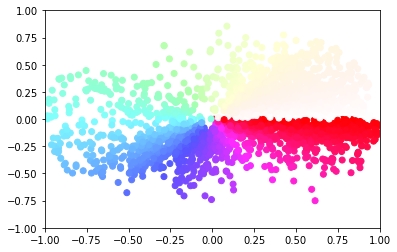

In [205]:
plt.xlim(-1, 1)
plt.ylim(-1, 1)

plt.scatter(np.array(samples_positioned_pool)[:, 0], np.array(samples_positioned_pool)[:, 1], c=[colorsys.hsv_to_rgb(*(hs[0], hs[0], 1)) for hs in hsv_samples_pool])

plt.show()

Now we should do the same with the query set. Intuitively, they should be in the same zone in the HSV color space.

Done 0/10
Done 1/10
Done 2/10
Done 3/10
Done 4/10
Done 5/10
Done 6/10
Done 7/10
Done 8/10
Done 9/10


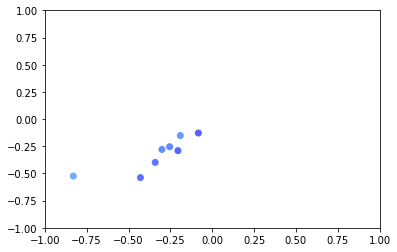

In [206]:
img_paths_query = os.path.join('shirt_dataset', 'labeled')

hsv_samples_query, no_regions_query = get_samples_in_feature_space(imgs_path_query)

samples_positioned_query = [(hsvs[1] * math.cos(hsvs[0] * 2 * math.pi), hsvs[1] * math.sin(hsvs[0] * 2 * math.pi))
                           for hsvs in hsv_samples_query]

hsv_samples_query = [hss for iihss, hss in enumerate(hsv_samples_query) if iihss not in no_regions_query]
samples_positioned_query = [spp for iispp, spp in enumerate(samples_positioned_query) if iispp not in no_regions_query]

no_regions_query = []

plt.xlim(-1, 1)
plt.ylim(-1, 1)

plt.scatter(np.array(samples_positioned_query)[:, 0], np.array(samples_positioned_query)[:, 1], c=[colorsys.hsv_to_rgb(*(hs[0], hs[0], 1)) for hs in hsv_samples_query])

plt.show()

### Sample matching

In order to match the query samples with the ones in the pool in the new feature space, I propose 2 methods and will try both.

#### K-means

The first one is computing a K-means clustering. Thus, we can get an estimation of the present colors and can help us validate the method by making sure that the input query falls in not too many different clusters (depending also on the distribution). Then, we can say that all the samples that fall in the same clusters present in the query set share the same subcolors, and therefore the same color. Below we compute it and plot the centers, as well as the query samples and then the obtained ones.

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


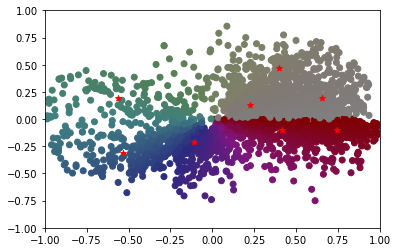

In [207]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=8).fit(np.array(samples_positioned_pool))

plt.xlim(-1, 1)
plt.ylim(-1, 1)

plt.scatter(np.array(samples_positioned_pool)[:, 0], np.array(samples_positioned_pool)[:, 1], c=[colorsys.hsv_to_rgb(*(hs[0], hs[0], 0.5)) for hs in hsv_samples_pool])

plt.scatter(np.array(kmeans.cluster_centers_)[:, 0], np.array(kmeans.cluster_centers_)[:, 1], c=colorsys.hsv_to_rgb(0, 1, 1), marker='*')

plt.show()

From the computed K-means we can see that 2 clusters are clearly representing blue. However, one is close to the center. Also, one cluster is representing green and could take some greenish-blue. The rest should not be taken.

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


[1 6]


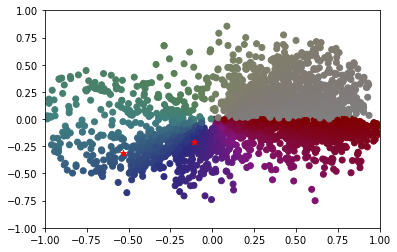

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


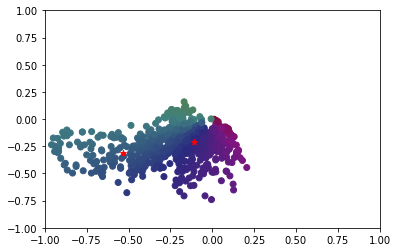

In [208]:
predicted_labels = kmeans.predict(samples_positioned_query)

print(np.unique(predicted_labels))

plt.xlim(-1, 1)
plt.ylim(-1, 1)

plt.scatter(np.array(samples_positioned_pool)[:, 0], np.array(samples_positioned_pool)[:, 1], c=[colorsys.hsv_to_rgb(*(hs[0], hs[0], 0.5)) for hs in hsv_samples_pool])

plt.scatter(np.array(kmeans.cluster_centers_)[np.unique(predicted_labels), 0], np.array(kmeans.cluster_centers_)[np.unique(predicted_labels), 1], c=colorsys.hsv_to_rgb(0, 1, 1), marker='*')

plt.show()

predicted_pool = kmeans.predict(samples_positioned_pool)

matching_pool = []
mcolors_pool = []
matching_indices = []

for iism, sampm in enumerate(predicted_pool):
    if sampm in np.unique(predicted_labels):
        matching_pool.append(samples_positioned_pool[iism])
        mcolors_pool.append(hsv_samples_pool[iism])
        matching_indices.append(iism)

plt.xlim(-1, 1)
plt.ylim(-1, 1)
        
plt.scatter(np.array(matching_pool)[:, 0], np.array(matching_pool)[:, 1], c=[colorsys.hsv_to_rgb(*(hs[0], hs[0], 0.5)) for hs in mcolors_pool])

plt.scatter(np.array(kmeans.cluster_centers_)[np.unique(predicted_labels), 0], np.array(kmeans.cluster_centers_)[np.unique(predicted_labels), 1], c=colorsys.hsv_to_rgb(0, 1, 1), marker='*')

plt.show()

Indeed, the 2 true clusters are taken. However, we can see an issue when taking the most centered one, since it is application-blind and just focuses in taking all samples close to it, no matter the color. Thus, some reddish and greenish samples are taken. That knowledge leads us to the other matching method. 

#### Query limit

The other method I propose assumes that the query samples represent the Hue range of the shirt colors we want to get. Thus, we will use it to limit the samples to get (minimum and maximum Hue). Furthermore, it will also tell the minimum saturation to get, so lower saturations will not make much sense.

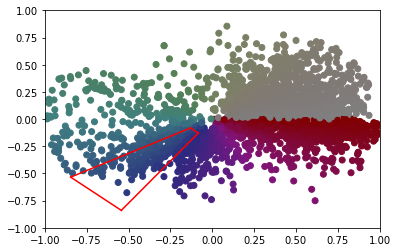

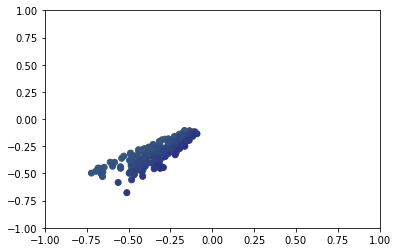

In [209]:
matching_pool = []
mcolors_pool = []
matching_indices = []

min_hue_q = np.array(hsv_samples_query)[:, 0].min()
max_hue_q = np.array(hsv_samples_query)[:, 0].max()
min_sat_q = np.array(hsv_samples_query)[:, 1].min()

for iih, hsvs in enumerate(hsv_samples_pool):
    if min_hue_q < hsvs[0] < max_hue_q and hsvs[1] > min_sat_q:
        matching_pool.append(samples_positioned_pool[iih])
        mcolors_pool.append(hsv_samples_pool[iih])
        matching_indices.append(iih)

plt.xlim(-1, 1)
plt.ylim(-1, 1)
        
plt.scatter(np.array(samples_positioned_pool)[:, 0], np.array(samples_positioned_pool)[:, 1], c=[colorsys.hsv_to_rgb(*(hs[0], hs[0], 0.5)) for hs in hsv_samples_pool])

plt.plot([min_sat_q * math.cos(2*math.pi*min_hue_q),math.cos(2*math.pi*min_hue_q)], [min_sat_q * math.sin(2*math.pi*min_hue_q),math.sin(2*math.pi*min_hue_q)], c='r')
plt.plot([min_sat_q * math.cos(2*math.pi*max_hue_q),math.cos(2*math.pi*max_hue_q)], [min_sat_q * math.sin(2*math.pi*max_hue_q),math.sin(2*math.pi*max_hue_q)], c='r')
plt.plot([min_sat_q * math.cos(2*math.pi*min_hue_q),min_sat_q * math.cos(2*math.pi*max_hue_q)], [min_sat_q * math.sin(2*math.pi*min_hue_q),min_sat_q * math.sin(2*math.pi*max_hue_q)], c='r')
plt.plot([math.cos(2*math.pi*min_hue_q),math.cos(2*math.pi*max_hue_q)], [math.sin(2*math.pi*min_hue_q),math.sin(2*math.pi*max_hue_q)], c='r')

plt.show()
        
plt.xlim(-1, 1)
plt.ylim(-1, 1)
        
plt.scatter(np.array(matching_pool)[:, 0], np.array(matching_pool)[:, 1], c=[colorsys.hsv_to_rgb(*(hs[0], hs[0], 0.5)) for hs in mcolors_pool])

plt.show()

As we can see, this method focuses on samples that are more unmistakably blue. As a con, we don't take **all** the samples we could consider as blue. However, the samples that we lose are not pure blue at all. Moreover, since we still have a high number of samples, I would prefer this method that will take fewer False Positives.

### Results

Thus, finally, all the resulting samples will be copied in a folder, so we can verify the new method. I am representing them below also.

In [210]:
from shutil import copyfile

imgs_path_result = 'resulting_blue'

if not os.path.exists(imgs_path_result):
    os.mkdir(imgs_path_result)
elif os.listdir(imgs_path_result):
    print('Directory not empty, adding _new suffix')
    imgs_path_result += '_new'

for mind in matching_indices:
    copyfile(os.path.join(imgs_path_pool, validimgfiles[mind]),
             os.path.join(imgs_path_result, validimgfiles[mind]))

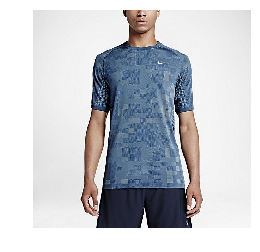

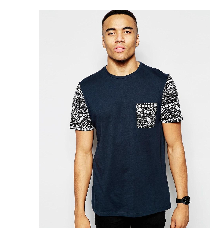

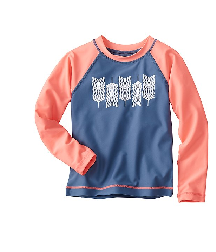

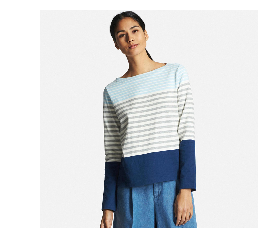

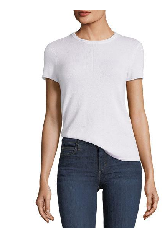

...

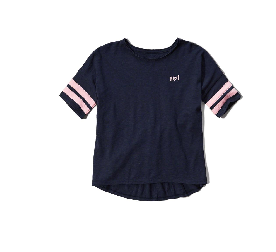

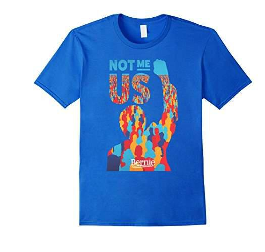

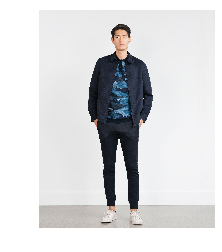

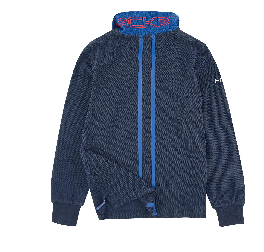

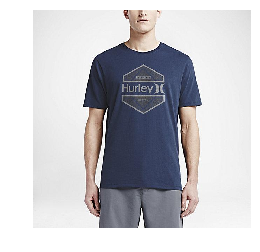

In [211]:
from PIL import Image

for fle in os.listdir(imgs_path_result):
    img = Image.open(os.path.join(imgs_path_result, fle))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

## Questions

### **1. Problem Analysis**

Read the *Method Explained* section

### **2. Models validation**

Usually, this problem could be validated through some metrics (Precision, Recall, etc). However, the unsupervised scenario adds complexity here.

First, some plots have been presented in this Notebook in order to visually validate each step. Since the only labels we have are the ones telling us that the query set contains blue shirts, it is not possible to validate it in an automatic manner at least until the Feature Extraction is completed. However, the different plots show how visually we can follow the method:

* Visualization of the different masks at each step for estimating the shirt pixels
* Visualization of the estimated pixels
* Plots for the distribution of the samples in the feature space
* Plots including the clusters or limits in the feature space and the resulting samples from the pool

These plots can be used as tools to visually validate that each step is giving us a reasonable result.

There is also a validation method for the Feature Extraction that does not require to check any image sample, but still requires human supervision: validating that the query samples are distributed over the blue region in the feature space. Moreover, as also stated during the *Method Explained* section, we can also verify that in the K-means approach all the query samples fall in a few clusters. In our case, they fell in 2, which are contained in the blue region in the feature space.

The sample matching stage can be validated by some fully unsupervised methods. One could be swapping a subset of the resulting images and the query set and repeating the method, so therefore we could compare how many of them are repeated (since the selected method uses the minimum and maximum hue, it is sure that not all the samples from the query set will be taken, however, we could still estimate the portion of the samples that still remain in the result).

In conclusion, due to the lack of human supervision, I cannot think of a method or metric that can automatically validate the model in a strict way. However, there are tools that can help us visually validate each step (presented during *Method Explained* and some tricks that may help us check that numbers make sense (examples explained in previous paragraphs).

### **3. Retrieval strategy**

Most of the decisions are already explained in the *Method Explained*. I am listing the most important ones:

* Feature Extraction + Sample matching pipeline: I decided to use this 2-stage pipeline since it seems reasonable for our problem. We want a specific feature, which is shirt color, so it makes sense to use this feature directly instead of the whole image, which contains irrelevant information. Then, we can directly work with the colors. It is also the common pipeline for Content-Based Image Retrieval applications.

* Forcing Feature extraction to get the color of the shirt: Instead of directly using a model to predict features from the image in a heuristic-free manner (e.g. using a VAE network) I prefer to search for a method to get the feature that I want (the shirt color) since the image contains lots of irrelevant features that will probably be represented in the feature space with the heuristic-free approach.

* Feature space to be Hue and Saturation from HSV: I commented that we want to use the shirt color, but the truth is that we just want some specific features of the color. The brightness is irrelevant to us since it does not represent the true color of the shirt but the light in the image. Thus, I decided to work in the HSV color space and discard the *V* value. Then we can work over a circular space being *H* the angle and *S* the distance to the center.

* Watershed for segmentation: I want a method that from a place in the image can detect whole objects/regions based on color homogeneity and the Watershed algorithm matches this definition

* Initial seed from Saturation threshold: Hard decision (gray thresholding was also considered), but as general rule backgrounds tend to be plain and white, while we are specifically searching for Blue shirts, which will probably have a high enough saturation value (otherwise they will tend to be more pale or gray). The issues will come with pale blue shirts or colored background regions. In the first case, we can consider that we have not found a blue shirt (but a more grayish color), while in the second one we will let it for further stages.

* Watershed postprocessing by position: I consider that objects within a border (and I considered the 10% on each border) are not shirts, and if part of the shirt is in this border, most of it will still be in the center, so we will rarely lose shirts while we can discard background elements.

* Watershed postprocessing by area: I consider that the small regions are most likely not part of the true shirt, while those which are may still be in an image where bigger chunks of it remain. Furthermore, the final composition of regions must be above an area threshold to be considered a shirt

* Watershed postprocessing by shape: the last feature to verify is the shape. In that sense, different techniques could be applied with more time, but as a toy example approach, I designed a shirt pattern and penalized those masks which do not follow this pattern. Since the method is not robust at all the restriction must be soft, but still, most of the False regions are filtered out (e.g. some backgrounds estimated as shirt).

* Mean of the pixels of the remaining regions: I also considered the Median, but I think that in case different colors are in the shirt it is visually more reasonable to get the mean color.

* Sample matching by Query samples Hue and Saturation limits: As told before, I also considered (and even tried) a K-means approach, but the K-means will not be limited to the color information but blindly pick all the close samples to the considered sample. That means that a more grayish blue can fall into a gray cluster and therefore get some other colors. A solution could be using mire clusters but then we can use part of the blue region in the feature space. Therefore, I think that just getting the samples within the Hue range considered in the query set and not allowing samples under a certain saturation threshold, defined also by the query set can give us a compact region of samples that should represent the desired color if the Feature Extraction stage is performed correctly. I also considered using a soft margin, allowing a 10% range more from the limits in the query set.

### **4. Final Summary**

There are different things that could be tried with more time. I found in the literature some methods that performed Region growing (like the Watershed algorithm) from a seed with a specific shape. I think that could be a solution for the hardest step in the whole process, the unsupervised shirt segmentation. I even pretended to do some experimental tries with that but due to technical issues and the required time, I decided to avoid this approach. I think it could be an interesting following experiment.

Being more conservative, also the segmentation postprocessing based on shape could also be improved. As told, I only provided a toy example method, but probably an approach based on angular features on the region would be more interesting. A foreground estimation technique more robust than just Saturation thresholding could also be interesting.

Also, at the current moment it is clear that our worst enemy are blue trousers, so some method could be applied to specifically avoid this (some postprocessing to specifically avoid trousers).

Finally, I used a strategy which applied hard filters over the samples (depending on color, position, area, and shape) for further sample matching, but it could also be interesting to study a pipeline where instead of hard margins the info for each sample region is kept and used for the final matching.

With more data, it would depend on the kind of data. Just more unsupervised samples or blue query samples would not change much the strategy. Maybe some outlier detection should be applied on the query to avoid distortions on the limits, but nothing else. However, if the extra data consisted of other query sets, other Sample matching strategies should be tried, such as a cluster estimation based on the information on the query sets (maybe K-NN from the pool samples to the query ones). If the extra data consisted in labels, the problem would absolutely change. Even if they were just a few labels, some weakly-supervised techniques could be applied to estimate the rest of the labels or perform a more robust segmentation technique (now we could guide a supervised loss). If these labels were pixel-wise, we could improve directly the segmentation step.

### **5. Code**

I will deliver a *README* file explaining how to follow it, but basically the code is explained here and I will also upload a python script to run it independently from the Notebook and get the results in a specific folder.
